In [1]:
import torch
# torch.autograd.set_detect_anomaly(True)
from torch.utils.data import DataLoader,WeightedRandomSampler
from torch.optim.lr_scheduler import PolynomialLR
import torch.nn.functional as F
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp

from tqdm.notebook import tqdm
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import os
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import (
    plot_some_images ,read_images ,
    pre_hard_skeletonize , pre_soft_skeletonize,
    compute_confution_matrix,draw_mask,TP_TN_FP_FN,)
from utils.preprocessing import (
    WhiteTopHat , CLAHE , normalize_xca,
    BrightnessMultiplicativeNNUNet2D,
    ContrastAugmentationNNUNet2D)
from utils.dataset import  (
    TrainUnetDataset  , collate_fn_train 
)
from models.nnunet import nnUnet
from models.conv_lstm import FullConvLSTM
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###
from trainer import evaluation

In [ ]:
args = {
    "base_path" : "./dataset/syntax/",
    "feature_map_size" : 2048,
    "hidden_size": 64,
    "padding": 1,
    "kernel_size": 3,
    "stack_size": 2,
    "base_channel" :32,
    "class_count" : 26 ,
    "image_shape" : (448,448),

    "report_class_wise":True,
    "attention" : False,
    "k":40,
    "batch_size" : 2,
    "num_workers" : 5,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "epcohs":10,
    "f_int_scale" : 2,
    "full_report_cycle" : 10,
    "max_channels":512,
    "loss_type":"tversky loss",
    "alpha":0.1,
    "beta":0.9,
    "t_gamma":2.00,
    "f_gamma":2.0,
    "f_loss_scale":1,
    "output_base_path" : "./outputs",
    "name" : "seq-lstm-tests",
    "deep_super_vision" : False,
    "mask_ce_weights":None,
    "layer_count":5,
    "sgd_conf":{
        "lr" : 0.1,
        "momentum" : 0.99,
        "weight_decay" : 3e-5,
        "nesterov":True
    },
    "adam_conf":{
        "lr" : 0.01,
        "weight_decay" : 3e-5,
    }
}
class_map = {
    1: '1',2: '2', 3: '3',4: '4',
    5: '5',6: '6',7:'9',8:'7',9:'9a',
    10:'10',11:'8',12:'10a',13:'12',14:'11',
    15:'12a',16:'12b',17:'13',18:'14',19:'14a',
    20:'14b',21:'15',22:'16',
    23: '16a',24: '16b',25: '16c',
}
# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","CE Loss",args["loss_type"]]
out_counts = args["layer_count"] if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights



[1.0]

In [3]:
b=0.999

train_class_counts = [
    1200,374,375,369,303,525,537,
    198,340,70,21,310,1,61,320,129,
    63,305,107,49,127,38,232,43,48,31
]
# f_alpha = (1-b)/(1-np.power(b,train_class_counts))
total = np.sum(train_class_counts)
mask_ce_weights = np.log(total/np.array(train_class_counts))
mask_ce_weights = (mask_ce_weights / mask_ce_weights.mean()).tolist()
mask_ce_weights[0]=0.1
# args["f_alpha"] = [0.1,1.75,1.5]
args["mask_ce_weights"]=mask_ce_weights
args["mask_ce_weights"]


[0.1,
 0.7182028607843546,
 0.7175189630226227,
 0.721650013218937,
 0.7721219167543302,
 0.6313418419654852,
 0.6255535829680703,
 0.8810920236198284,
 0.7426136620601264,
 1.1473979162000387,
 1.4557589006003677,
 0.7662722761297971,
 2.2355206465069903,
 1.1826454428915965,
 0.7581408134999629,
 0.9908276338197994,
 1.1743828050683243,
 0.7704369135741549,
 1.0387177833927879,
 1.2387493457578322,
 0.9948295833595646,
 1.3038636813131317,
 0.8405046696823193,
 1.2722037293518427,
 1.2440303485152229,
 1.3560093560621693]

In [4]:
# args["t_alpha"] = [1,0.8]
args["t_alpha"] = None

In [5]:
train_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    A.Downscale(
        scale_range=[0.7, 1],
        interpolation_pair={"downscale": 0, "upscale": 0},
        p=0.5
    ),
    A.GaussNoise(
        std_range=[0.0, 0.1],
        mean_range=[0, 0],
        per_channel=True,
        noise_scale_factor=1,
        p=0.5
    ),
    A.GaussianBlur(
        sigma_limit=[1.0,1.5],
        blur_limit = (3,7),
        p=0.5
    ),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.5),
    A.Compose([
        A.InvertImg(p=1.0),
        A.RandomGamma(gamma_limit=(70, 150), p=1.0),
        A.InvertImg(p=1.0),
    ], p=0.5),
    BrightnessMultiplicativeNNUNet2D(multiplier_range=(0.70, 1.3), p=0.5),
    ContrastAugmentationNNUNet2D(contrast_range=(0.65, 1.5), p=0.5),
    A.RandomGamma(
        gamma_limit=(90, 120), 
        p=0.5
    ),
    A.Affine(
        scale=(0.7, 1.4),  
        translate_percent=(0, 0),
        rotate=0,               
        shear=0,                 
        fit_output=False, 
        p=0.5
    ),
    A.Rotate(limit=30, p=0.5, fill_mask = 0),
    A.Rotate(limit=-30, p=0.5, fill_mask = 0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    # A.Lambda(image=normalize_xca),
    A.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
    ]
)
test_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    # A.Lambda(image=normalize_xca),
    A.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])

    ]  
)

train_preprocess = None


/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:47: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)
/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:60: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


In [6]:
train_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "train",chosen_labels=[19,25])
valid_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "val",chosen_labels=[19,25])


NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

In [7]:

train_ds = TrainUnetDataset(transform = train_transforms,data = train_images)
valid_ds = TrainUnetDataset(transform = test_transforms,data = valid_images)
# sampler = WeightedRandomSampler(
#     weights=sampler_weights, 
#     num_samples=len(sampler_weights),
#     replacement=True)

train_loader = DataLoader(
    train_ds,
    batch_size = args["batch_size"] ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=True,
    collate_fn=collate_fn_train
    # sampler=sampler
)
valid_loader = DataLoader(
    valid_ds,
    batch_size = args["batch_size"]  ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=False,
    collate_fn=collate_fn_train
)


In [8]:
# contexts , targets = next(iter(train_loader))
# context = contexts[0]
# target = targets[0]
# plt.figure(figsize=(10,10))
# for i in range(context.shape[0]):
    
#     plt.subplot(3,3,i+1)
#     plt.imshow(context[i][0])
    
# plt.figure(figsize=(10,10))
# for i in range(target.shape[0]):
#     print(np.unique(target[i]))
#     plt.subplot(3,3,i+1)
#     plt.imshow(target[i])

In [ ]:

# model = nnUnet(args).to(args["device"])
model = FullConvLSTM(args).to(args["device"])

loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(
#     model.parameters(), 
#     **args["adam_conf"]
# )
optimizer = torch.optim.SGD(
    model.parameters(),
    **args["sgd_conf"]
)
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-2)
# lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
lr_sch = None
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map,class_count=args["class_count"]-1)


best_model = trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)
# best_model = model


loss is set to tversky


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.5223, device='cuda:0')

--- Gradient norms ---
fcn.conv1.weight              : 0.009201
fcn.bn1.weight                : 0.001448
fcn.bn1.bias                  : 0.001092
fcn.layer1.0.conv1.weight     : 0.008141
fcn.layer1.0.bn1.weight       : 0.000882
fcn.layer1.0.bn1.bias         : 0.000893
fcn.layer1.0.conv2.weight     : 0.016561
fcn.layer1.0.bn2.weight       : 0.002171
fcn.layer1.0.bn2.bias         : 0.002504
fcn.layer1.0.conv3.weight     : 0.021435
fcn.layer1.0.bn3.weight       : 0.002558
fcn.layer1.0.bn3.bias         : 0.001766
fcn.layer1.0.downsample.0.weight: 0.014049
fcn.layer1.0.downsample.1.weight: 0.002684
fcn.layer1.0.downsample.1.bias: 0.001766
fcn.layer1.1.conv1.weight     : 0.017877
fcn.layer1.1.bn1.weight       : 0.000946
fcn.layer1.1.bn1.bias         : 0.000964
fcn.layer1.1.conv2.weight     : 0.018170
fcn.layer1.1.bn2.weight       : 0.001054
fcn.layer1.1.bn2.bias         : 0.000609
fcn.layer1.1.conv3.weight     : 0.014188
fcn.layer1.1.bn3.we

  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.1172, device='cuda:0')

--- Gradient norms ---
fcn.conv1.weight              : 0.004455
fcn.bn1.weight                : 0.001175
fcn.bn1.bias                  : 0.000548
fcn.layer1.0.conv1.weight     : 0.007213
fcn.layer1.0.bn1.weight       : 0.000732
fcn.layer1.0.bn1.bias         : 0.000670
fcn.layer1.0.conv2.weight     : 0.009477
fcn.layer1.0.bn2.weight       : 0.001150
fcn.layer1.0.bn2.bias         : 0.000693
fcn.layer1.0.conv3.weight     : 0.011396
fcn.layer1.0.bn3.weight       : 0.001332
fcn.layer1.0.bn3.bias         : 0.000808
fcn.layer1.0.downsample.0.weight: 0.008120
fcn.layer1.0.downsample.1.weight: 0.001328
fcn.layer1.0.downsample.1.bias: 0.000808
fcn.layer1.1.conv1.weight     : 0.011461
fcn.layer1.1.bn1.weight       : 0.000759
fcn.layer1.1.bn1.bias         : 0.000551
fcn.layer1.1.conv2.weight     : 0.011862
fcn.layer1.1.bn2.weight       : 0.000750
fcn.layer1.1.bn2.bias         : 0.000355
fcn.layer1.1.conv3.weight     : 0.009612
fcn.layer1.1.bn3.we

  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (2)
total loss : 1.2361642553806305 - CE Loss : 0.2512217913419008 - tversky loss : 0.984942461848259

class wise loss :
1 : 0.93441241979599
2 : 0.9926119446754456
3 : 0.9793277978897095
4 : 0.9951714277267456
5 : 0.7973986864089966
6 : 0.9818375110626221
9 : 0.9945881366729736
7 : 0.9842969179153442
9a : 0.9993768334388733
10 : 0.9999694228172302
8 : 0.9938686490058899
10a : 0.9999998807907104
12 : 0.9993888735771179
11 : 0.9907693862915039
12a : 0.9971310496330261
12b : 0.9991666674613953
13 : 0.9912002682685852
14 : 0.998439610004425
14a : 0.9996899366378784
14b : 0.9993804693222046
15 : 0.9999236464500427
16 : 0.9958441853523254
16a : 0.9999285936355591
16b : 0.999886155128479
16c : 0.9999541640281677
train avg metrics for epoch 2 :
avg dice : 0.00437838148379918 - avg precision : 0.0065568919479846955 - avg recall : 0.004022514142561704
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (2)
total loss : 1.236459345817566 

  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (3)
total loss : 1.2320447499752045 - CE Loss : 0.2498743757009506 - tversky loss : 0.9821703736782074

class wise loss :
1 : 0.9103026986122131
2 : 0.9926043748855591
3 : 0.9114400148391724
4 : 0.994644284248352
5 : 0.8174702525138855
6 : 0.9859188795089722
9 : 0.9944754838943481
7 : 0.980739951133728
9a : 0.9993848204612732
10 : 0.9999354481697083
8 : 0.9942007660865784
10a : 0.9999999403953552
12 : 0.9994733929634094
11 : 0.991849422454834
12a : 0.9973785877227783
12b : 0.9991199970245361
13 : 0.9922245740890503
14 : 0.9985303282737732
14a : 0.9997808337211609
14b : 0.9994880557060242
15 : 0.9999117851257324
16 : 0.9956338405609131
16a : 0.9998879432678223
16b : 0.9999098181724548
16c : 0.999954342842102
train avg metrics for epoch 3 :
avg dice : 0.0061546749440984415 - avg precision : 0.011350401192903519 - avg recall : 0.006196656954707578
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (3)
total loss : 1.22119539499282

  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (4)
total loss : 1.225265727519989 - CE Loss : 0.2459093402326107 - tversky loss : 0.9793563870191574

class wise loss :
1 : 0.9202200770378113
2 : 0.9898616671562195
3 : 0.8614062666893005
4 : 0.993794858455658
5 : 0.8113489747047424
6 : 0.9809592962265015
9 : 0.9948374032974243
7 : 0.9715828895568848
9a : 0.999234139919281
10 : 0.9999546408653259
8 : 0.9935566782951355
10a : 0.9999998807907104
12 : 0.9994583129882812
11 : 0.9883970022201538
12a : 0.9972887635231018
12b : 0.9993951916694641
13 : 0.9903627038002014
14 : 0.9985332489013672
14a : 0.9997521042823792
14b : 0.9994267225265503
15 : 0.9999370574951172
16 : 0.994831919670105
16a : 0.9999027252197266
16b : 0.9998980760574341
16c : 0.9999681711196899
train avg metrics for epoch 4 :
avg dice : 0.008835308924886856 - avg precision : 0.01474476546049118 - avg recall : 0.009409369472414254
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (4)
total loss : 1.2128812968730927

  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (5)
total loss : 1.2220838980674744 - CE Loss : 0.24424621269106864 - tversky loss : 0.9778376865386963

class wise loss :
1 : 0.9087134003639221
2 : 0.9908186197280884
3 : 0.8510879874229431
4 : 0.9941466450691223
5 : 0.8025934100151062
6 : 0.9791200160980225
9 : 0.9948896765708923
7 : 0.9758092761039734
9a : 0.9991077184677124
10 : 0.9999330043792725
8 : 0.9917522668838501
10a : 0.9999996423721313
12 : 0.9992877244949341
11 : 0.9878044724464417
12a : 0.996562659740448
12b : 0.9988744854927063
13 : 0.9871149659156799
14 : 0.998247504234314
14a : 0.9997225403785706
14b : 0.9993913769721985
15 : 0.999916672706604
16 : 0.9913414120674133
16a : 0.999860405921936
16b : 0.9998852014541626
16c : 0.9999620914459229
train avg metrics for epoch 5 :
avg dice : 0.008135867864456532 - avg precision : 0.01462470144033432 - avg recall : 0.008431510105729102
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (5)
total loss : 1.208066337108612

  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (6)
total loss : 1.2116463718414308 - CE Loss : 0.23912312264740468 - tversky loss : 0.9725232462882996

class wise loss :
1 : 0.8548235297203064
2 : 0.9837396144866943
3 : 0.838668704032898
4 : 0.9930217266082764
5 : 0.7567448019981384
6 : 0.9851720929145813
9 : 0.9918451309204102
7 : 0.973592221736908
9a : 0.9991069436073303
10 : 0.9999546408653259
8 : 0.9886221885681152
10a : 0.999999463558197
12 : 0.9994402527809143
11 : 0.9884793758392334
12a : 0.997418999671936
12b : 0.9989232420921326
13 : 0.9857856631278992
14 : 0.9975874423980713
14a : 0.9996761083602905
14b : 0.9992431402206421
15 : 0.9999107718467712
16 : 0.9815347790718079
16a : 0.9999203681945801
16b : 0.9999049305915833
16c : 0.9999650716781616
train avg metrics for epoch 6 :
avg dice : 0.013920541108261318 - avg precision : 0.016211082339286805 - avg recall : 0.015931119322776795
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (6)
total loss : 1.20135274767875

  0%|          | 0/500 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.0987, device='cuda:0')

--- Gradient norms ---
fcn.conv1.weight              : 0.004742
fcn.bn1.weight                : 0.001006
fcn.bn1.bias                  : 0.000806
fcn.layer1.0.conv1.weight     : 0.002727
fcn.layer1.0.bn1.weight       : 0.000710
fcn.layer1.0.bn1.bias         : 0.000568
fcn.layer1.0.conv2.weight     : 0.003505
fcn.layer1.0.bn2.weight       : 0.000855
fcn.layer1.0.bn2.bias         : 0.000943
fcn.layer1.0.conv3.weight     : 0.003207
fcn.layer1.0.bn3.weight       : 0.000710
fcn.layer1.0.bn3.bias         : 0.000715
fcn.layer1.0.downsample.0.weight: 0.004759
fcn.layer1.0.downsample.1.weight: 0.000726
fcn.layer1.0.downsample.1.bias: 0.000715
fcn.layer1.1.conv1.weight     : 0.004398
fcn.layer1.1.bn1.weight       : 0.000925
fcn.layer1.1.bn1.bias         : 0.000811
fcn.layer1.1.conv2.weight     : 0.004818
fcn.layer1.1.bn2.weight       : 0.000643
fcn.layer1.1.bn2.bias         : 0.000348
fcn.layer1.1.conv3.weight     : 0.003376
fcn.layer1.1.bn3.we

  0%|          | 0/500 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (8)
total loss : 1.208541484117508 - CE Loss : 0.23741315272450447 - tversky loss : 0.9711283316612244

class wise loss :
1 : 0.8670853972434998
2 : 0.9641180634498596
3 : 0.8347931504249573
4 : 0.9923542737960815
5 : 0.7695056200027466
6 : 0.983204185962677
9 : 0.993113100528717
7 : 0.9530375599861145
9a : 0.9991694092750549
10 : 0.9999294877052307
8 : 0.9917243719100952
10a : 0.9999996423721313
12 : 0.999395489692688
11 : 0.9890777468681335
12a : 0.9970806837081909
12b : 0.9991223216056824
13 : 0.9805116057395935
14 : 0.9980106949806213
14a : 0.9997503757476807
14b : 0.9992666244506836
15 : 0.9999070167541504
16 : 0.9683751463890076
16a : 0.9998541474342346
16b : 0.9998691082000732
16c : 0.9999536871910095
train avg metrics for epoch 8 :
avg dice : 0.014545333467500692 - avg precision : 0.033412395417690276 - avg recall : 0.017855437753896693
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (8)
total loss : 1.19804401993751

  0%|          | 0/500 [00:00<?, ?it/s]

Save Model
Saving Memory
Saving All Plots


  0%|          | 0/100 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 11/11 [00:00<00:00, 2515.53it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./models/swin_encoder.py
processing ./models/swin_blocks.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


processing ./temp_script.py


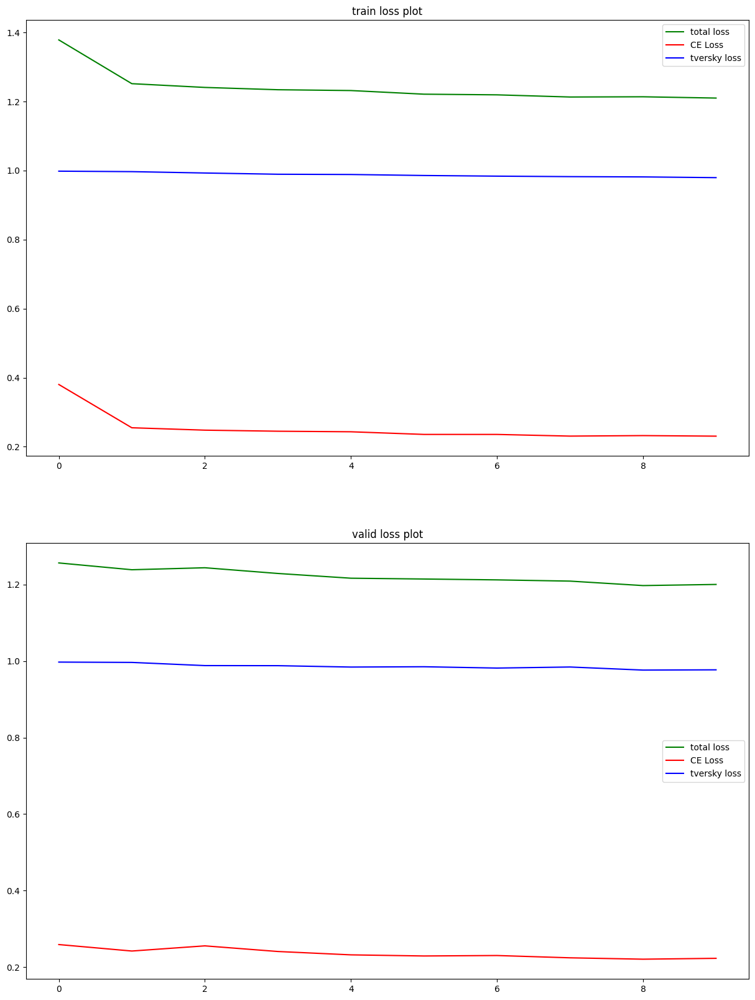

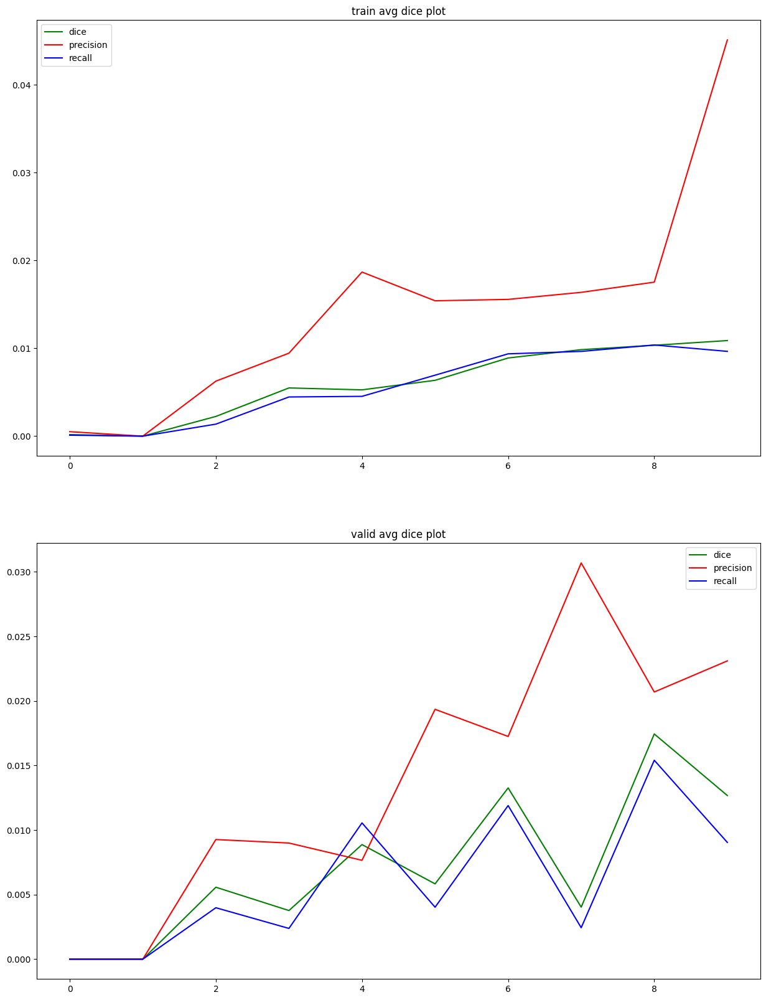

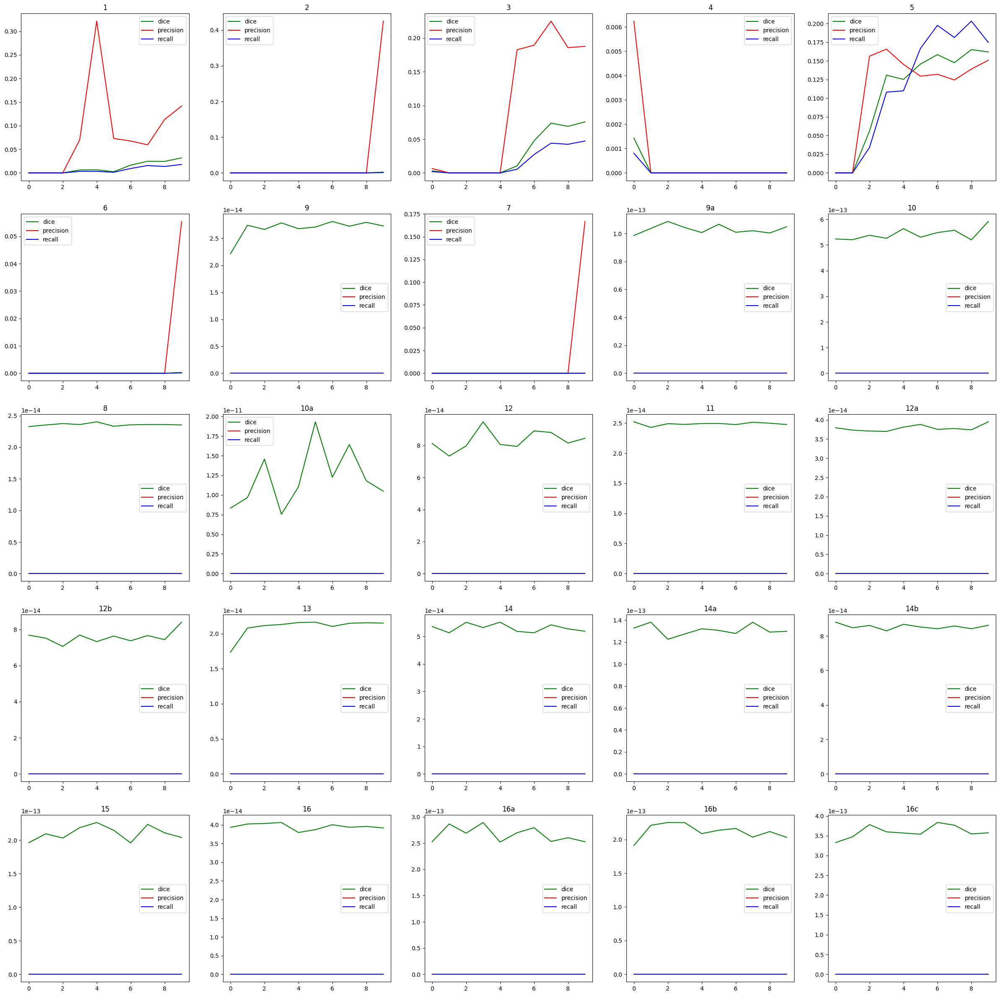

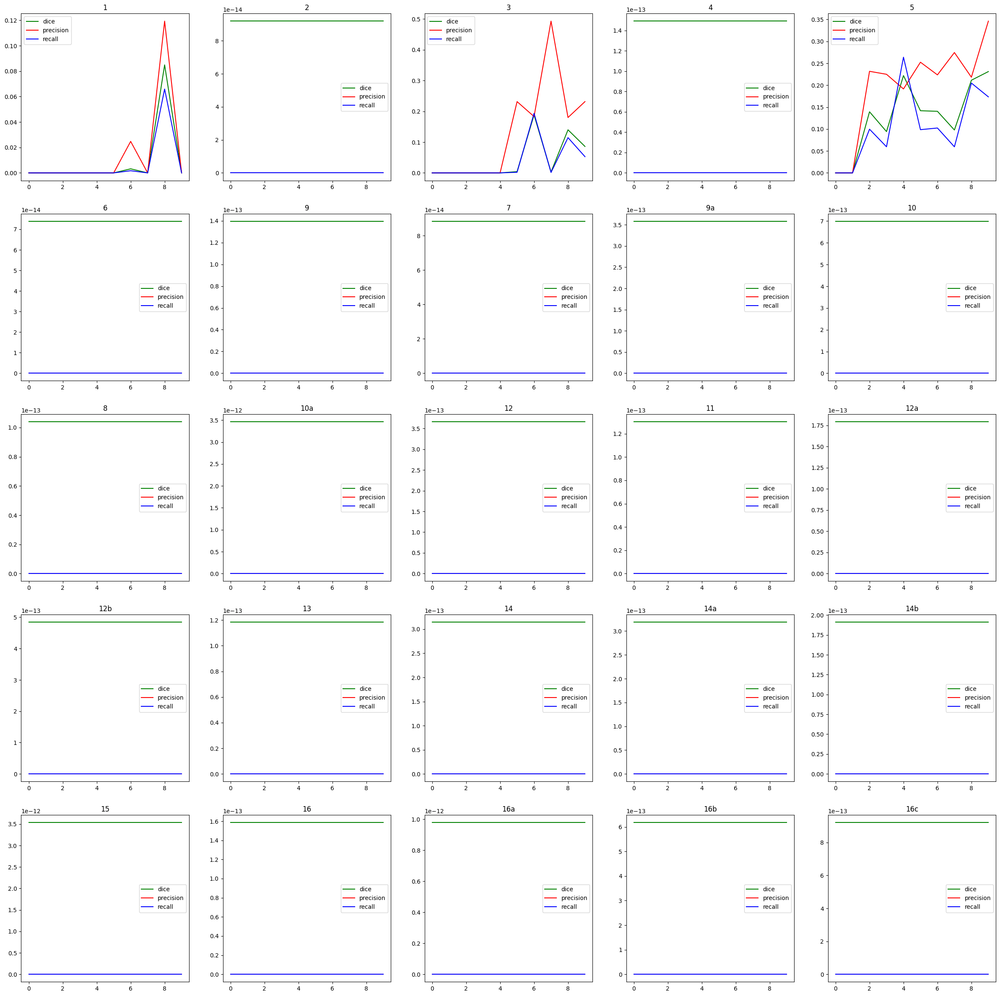

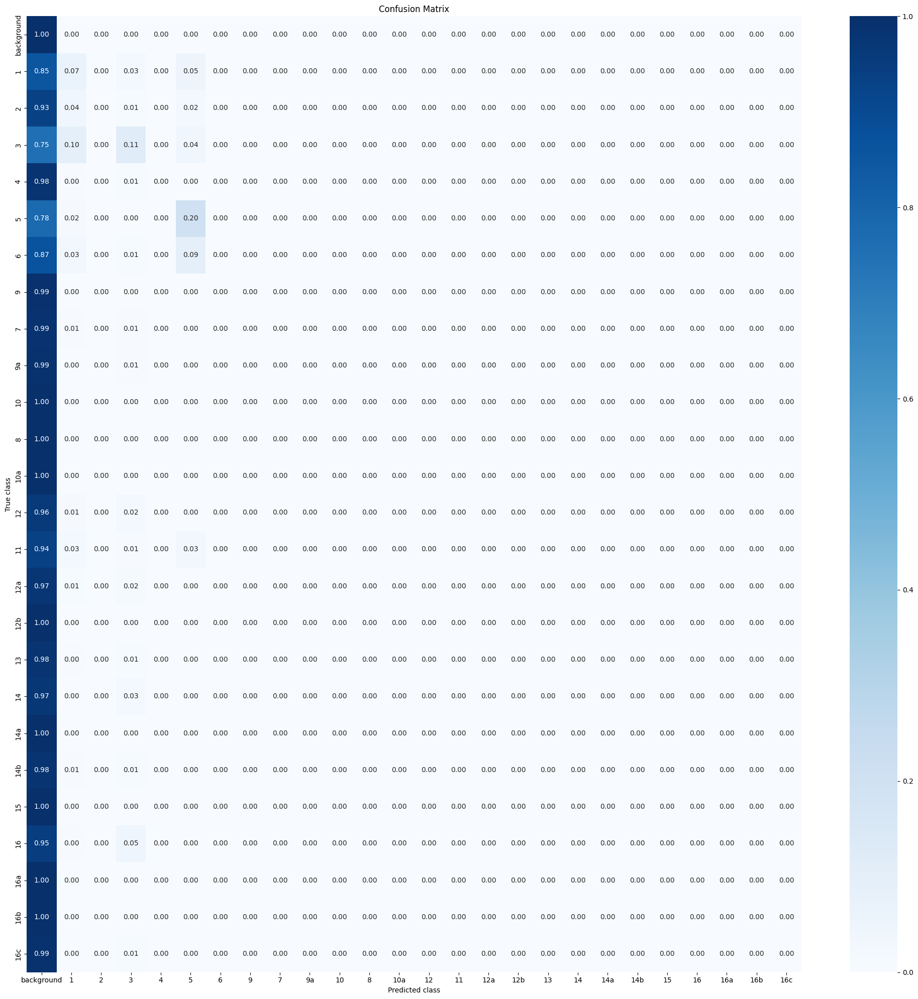

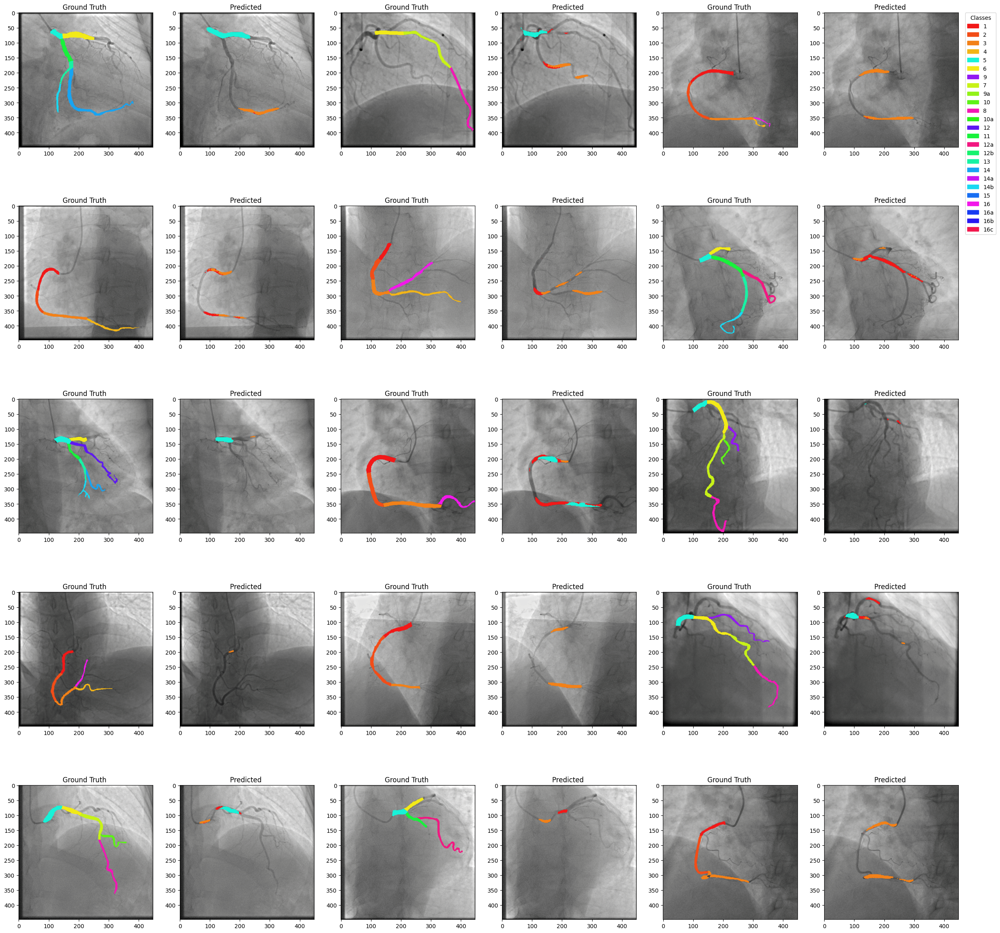

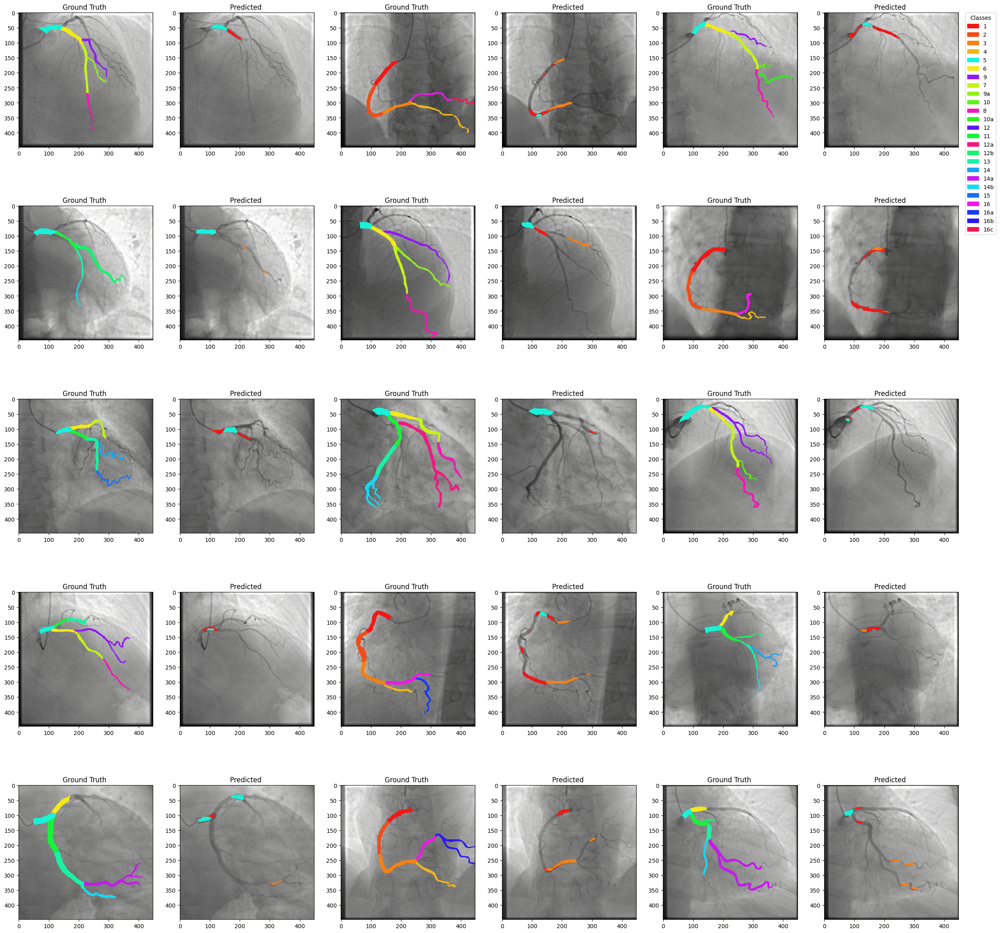

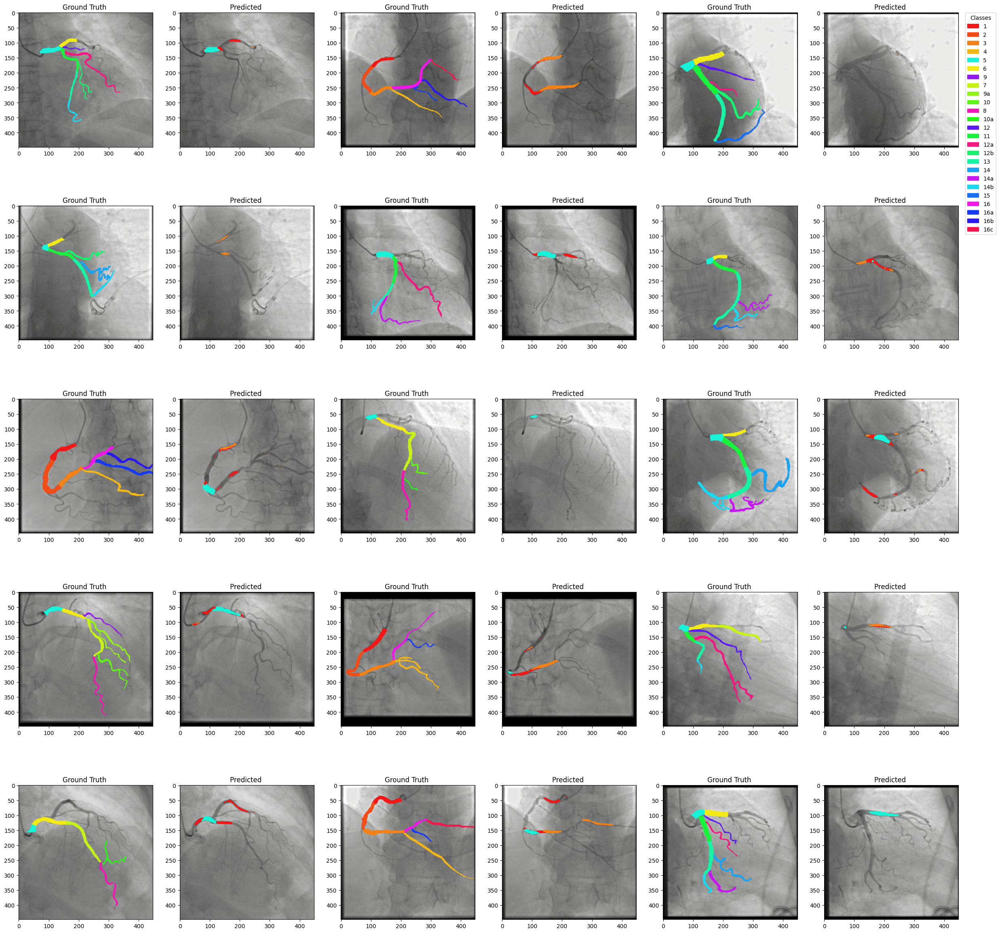

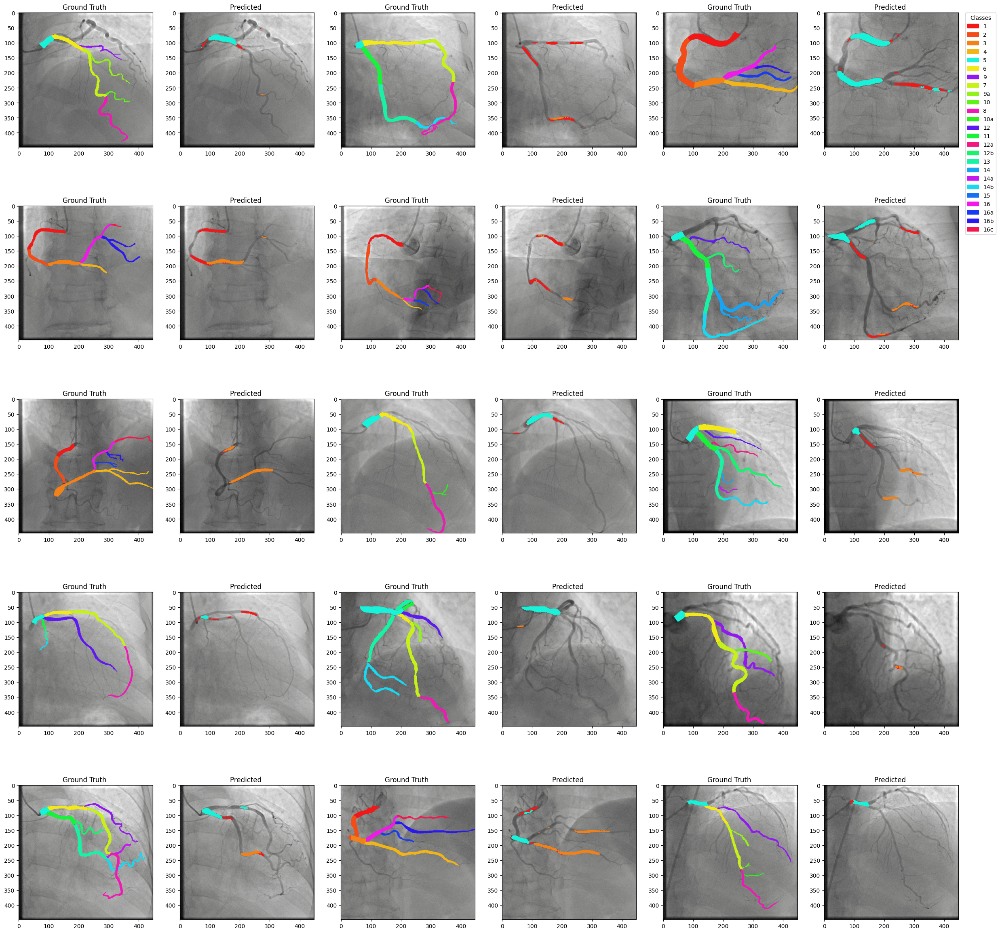

In [ ]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    args=args,
    class_map=class_map,
    name=args["name"],
    valid_images = valid_images,
    test_transforms = test_transforms,
    notebook_name = "Multi_Main.ipynb",
    class_count = args["class_count"],
    device = args["device"]
)